In [1]:
# -------------------- 1. Imports --------------------
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import torchvision
from torchvision import datasets, transforms, models
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

/opt/anaconda3/envs/geo/lib/python3.10/site-packages/torchvision/io/image.py:14: UserWarning: Failed to load image Python extension: 'dlopen(/opt/anaconda3/envs/geo/lib/python3.10/site-packages/torchvision/image.so, 0x0006): Library not loaded: @rpath/libjpeg.9.dylib
  Referenced from: <0B7EB158-53DC-3403-8A49-22178CAB4612> /opt/anaconda3/envs/geo/lib/python3.10/site-packages/torchvision/image.so
  Reason: tried: '/opt/anaconda3/envs/geo/lib/python3.10/site-packages/torchvision/../../../libjpeg.9.dylib' (no such file), '/opt/anaconda3/envs/geo/lib/python3.10/site-packages/torchvision/../../../libjpeg.9.dylib' (no such file), '/opt/anaconda3/envs/geo/lib/python3.10/lib-dynload/../../libjpeg.9.dylib' (no such file), '/opt/anaconda3/envs/geo/bin/../lib/libjpeg.9.dylib' (no such file)'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed

In [2]:
# -------------------- 2. Device Setup --------------------
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("✅ Using CUDA GPU.")
elif torch.backends.mps.is_available() and torch.backends.mps.is_built():
    device = torch.device("mps")
    print("✅ Using Apple MPS backend (Metal GPU).")
else:
    device = torch.device("cpu")
    print("⚠️ GPU not available. Using CPU.")

✅ Using Apple MPS backend (Metal GPU).


In [3]:
# -------------------- 3. Compute Mean and Std --------------------
def compute_mean_std(path):
    print(f"🔍 Computing mean and std for dataset at: {path}")
    loader = DataLoader(datasets.ImageFolder(root=path, transform=transforms.ToTensor()), batch_size=32)
    mean, std, samples = 0., 0., 0
    for data, _ in loader:
        batch = data.size(0)
        data = data.view(batch, data.size(1), -1)
        mean += data.mean(2).sum(0)
        std += data.std(2).sum(0)
        samples += batch
    mean /= samples
    std /= samples
    print(f"✅ Dataset Mean: {mean}, Std: {std}")
    return mean, std

mean, std = compute_mean_std('./data/train')

🔍 Computing mean and std for dataset at: ./data/train
✅ Dataset Mean: tensor([0.4886, 0.4886, 0.4760]), Std: tensor([0.1493, 0.1406, 0.1353])


In [4]:
# -------------------- 4. Transforms --------------------
print("🔁 Preparing transforms...")
transform_cnn = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean.tolist(), std.tolist())
])
transform_resnet = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean.tolist(), std.tolist())
])

🔁 Preparing transforms...


In [5]:
# -------------------- 5. Load Datasets --------------------
def load_data(transform):
    train_set = datasets.ImageFolder('./data/train', transform=transform)
    val_set = datasets.ImageFolder('./data/test', transform=transform)
    print(f"✅ Training samples: {len(train_set)}, Validation samples: {len(val_set)}")
    return (DataLoader(train_set, batch_size=32, shuffle=True),
            DataLoader(val_set, batch_size=32, shuffle=False),
            train_set.classes)

train_loader_cnn, val_loader_cnn, class_names = load_data(transform_cnn)
train_loader_resnet, val_loader_resnet, _ = load_data(transform_resnet)
print(f"📊 Class names: {class_names}")

✅ Training samples: 4200, Validation samples: 1346
✅ Training samples: 4200, Validation samples: 1346
📊 Class names: ['car', 'not_car']


In [6]:
# -------------------- 6. CNN Model --------------------
print("🧠 Defining custom CNN model...")
class CarClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(0.1)
        self.fc1 = nn.Linear(32 * 30 * 30, 256)
        self.fc2 = nn.Linear(256, 2)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.dropout(x)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        return self.fc2(x)

🧠 Defining custom CNN model...


In [7]:
# -------------------- 7. Training Function --------------------
def train_model(model, loader, val_loader, criterion, optimizer, tag, epochs):
    print(f"🚀 Starting training for model: {tag}")
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
    writer = SummaryWriter(f'runs/{tag}_{timestamp}')
    best_vloss, best_model_path = float('inf'), None

    for epoch in range(epochs):
        print(f"\n📚 Epoch {epoch + 1}")
        model.train()
        running_loss = 0.0
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            loss = criterion(model(inputs), labels)
            loss.backward()
            if device.type == 'mps': torch.mps.synchronize()
            optimizer.step()
            running_loss += loss.item()

        avg_loss = running_loss / len(loader)
        model.eval()
        vloss = sum(criterion(model(v.to(device)), l.to(device)).item() for v, l in val_loader) / len(val_loader)

        print(f"📈 Epoch {epoch + 1}: Train Loss = {avg_loss:.4f}, Val Loss = {vloss:.4f}")
        print(f"🔢 Learning Rate: {optimizer.param_groups[0]['lr']:.1e}")
        writer.add_scalars(f'Loss/train_vs_val_{tag}', {'Train': avg_loss, 'Val': vloss}, epoch + 1)

        if vloss < best_vloss:
            best_vloss = vloss
            best_model_path = f'model_{tag}_{timestamp}_epoch{epoch+1}.pt'
            torch.save(model.state_dict(), best_model_path)
            print(f'💾 Model saved to {best_model_path}')

    writer.close()
    return best_model_path

In [8]:
# -------------------- 8. Train Both Models --------------------
car_model = CarClassifier().to(device)
car_optimizer = optim.Adam(car_model.parameters(), lr=1e-4)
cnn_model_path = train_model(car_model, train_loader_cnn, val_loader_cnn, nn.CrossEntropyLoss(), car_optimizer, "cnn",40)

resnet_model = models.resnet18(pretrained=True)
for param in resnet_model.parameters():
    param.requires_grad = False
resnet_model.fc = nn.Linear(resnet_model.fc.in_features, 2)
resnet_model.to(device)
resnet_optimizer = optim.Adam(resnet_model.fc.parameters(), lr=1e-4)
resnet_model_path = train_model(resnet_model, train_loader_resnet, val_loader_resnet, nn.CrossEntropyLoss(), resnet_optimizer, "resnet18",30)

🚀 Starting training for model: cnn

📚 Epoch 1
📈 Epoch 1: Train Loss = 0.1791, Val Loss = 0.1222
🔢 Learning Rate: 1.0e-04
💾 Model saved to model_cnn_20250612_153052_epoch1.pt

📚 Epoch 2
📈 Epoch 2: Train Loss = 0.0509, Val Loss = 0.1233
🔢 Learning Rate: 1.0e-04

📚 Epoch 3
📈 Epoch 3: Train Loss = 0.0310, Val Loss = 0.1216
🔢 Learning Rate: 1.0e-04
💾 Model saved to model_cnn_20250612_153052_epoch3.pt

📚 Epoch 4
📈 Epoch 4: Train Loss = 0.0212, Val Loss = 0.1366
🔢 Learning Rate: 1.0e-04

📚 Epoch 5
📈 Epoch 5: Train Loss = 0.0079, Val Loss = 0.1055
🔢 Learning Rate: 1.0e-04
💾 Model saved to model_cnn_20250612_153052_epoch5.pt

📚 Epoch 6
📈 Epoch 6: Train Loss = 0.0055, Val Loss = 0.1177
🔢 Learning Rate: 1.0e-04

📚 Epoch 7
📈 Epoch 7: Train Loss = 0.0035, Val Loss = 0.1365
🔢 Learning Rate: 1.0e-04

📚 Epoch 8
📈 Epoch 8: Train Loss = 0.0025, Val Loss = 0.1366
🔢 Learning Rate: 1.0e-04

📚 Epoch 9
📈 Epoch 9: Train Loss = 0.0017, Val Loss = 0.1125
🔢 Learning Rate: 1.0e-04

📚 Epoch 10
📈 Epoch 10: Train Lo

/opt/anaconda3/envs/geo/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/geo/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


📈 Epoch 1: Train Loss = 0.5453, Val Loss = 0.4688
🔢 Learning Rate: 1.0e-04
💾 Model saved to model_resnet18_20250612_153232_epoch1.pt

📚 Epoch 2
📈 Epoch 2: Train Loss = 0.3832, Val Loss = 0.3854
🔢 Learning Rate: 1.0e-04
💾 Model saved to model_resnet18_20250612_153232_epoch2.pt

📚 Epoch 3
📈 Epoch 3: Train Loss = 0.3110, Val Loss = 0.3297
🔢 Learning Rate: 1.0e-04
💾 Model saved to model_resnet18_20250612_153232_epoch3.pt

📚 Epoch 4
📈 Epoch 4: Train Loss = 0.2616, Val Loss = 0.3058
🔢 Learning Rate: 1.0e-04
💾 Model saved to model_resnet18_20250612_153232_epoch4.pt

📚 Epoch 5
📈 Epoch 5: Train Loss = 0.2337, Val Loss = 0.2793
🔢 Learning Rate: 1.0e-04
💾 Model saved to model_resnet18_20250612_153232_epoch5.pt

📚 Epoch 6
📈 Epoch 6: Train Loss = 0.2114, Val Loss = 0.2594
🔢 Learning Rate: 1.0e-04
💾 Model saved to model_resnet18_20250612_153232_epoch6.pt

📚 Epoch 7
📈 Epoch 7: Train Loss = 0.1980, Val Loss = 0.2432
🔢 Learning Rate: 1.0e-04
💾 Model saved to model_resnet18_20250612_153232_epoch7.pt

📚 

In [9]:
# -------------------- 9. Misclassification Visualization --------------------
def visualize_specific_misclassifications(model, transform, model_path, split, label_names, group_name, true_class, pred_class):
    print(f"\n🎨 Visualizing {group_name.upper()} (True: {true_class}, Pred: {pred_class})")
    print(f"🔍 Available class labels: {label_names}")

    try:
        true_class_idx = label_names.index(true_class)
        pred_class_idx = label_names.index(pred_class)
    except ValueError as e:
        print(f"❌ Error: Class not found in label_names - {e}")
        return

    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    loader = DataLoader(datasets.ImageFolder(f'./data/{split}', transform=transform), batch_size=32)
    group = []

    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs.to(device))
            preds = torch.argmax(outputs, 1)
            for i in range(len(labels)):
                if labels[i].item() == true_class_idx and preds[i].item() == pred_class_idx:
                    img = inputs[i] * std[:, None, None] + mean[:, None, None]
                    img = img.permute(1, 2, 0).numpy()
                    group.append((img, label_names[labels[i].item()], label_names[preds[i].item()]))

    if not group:
        print("✅ No misclassifications in this group.")
        return

    cols = 5
    rows = (len(group) + cols - 1) // cols
    plt.figure(figsize=(4 * cols, 4 * rows))
    for i, (img, true_lbl, pred_lbl) in enumerate(group[:cols * rows]):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(f"True: {true_lbl}\nPred: {pred_lbl}", fontsize=10)
        plt.xlabel(f"{true_lbl} → {pred_lbl}", fontsize=9)
        plt.axis("off")
    plt.suptitle(f"{group_name} - {true_class} → {pred_class}", fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


================= MISCLASSIFICATION ANALYSIS (8 GROUPS) =================

🎨 Visualizing CNN TEST (True: car, Pred: not_car)
🔍 Available class labels: ['car', 'not_car']


/var/folders/6r/lw1cp6x117zfdkxgl862fymc0000gn/T/ipykernel_14380/1997060676.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path,

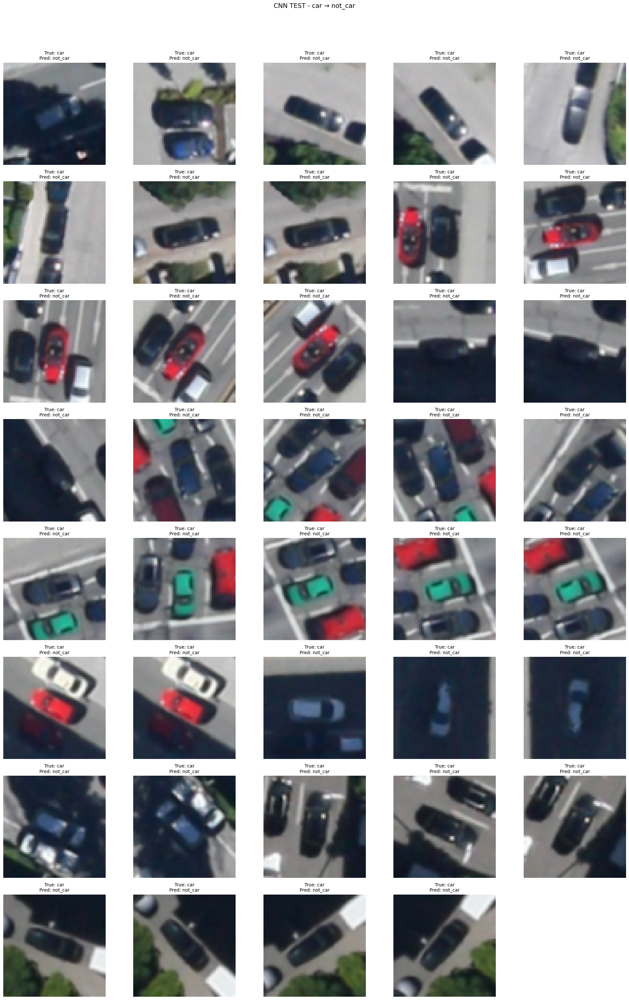


🎨 Visualizing CNN TEST (True: not_car, Pred: car)
🔍 Available class labels: ['car', 'not_car']


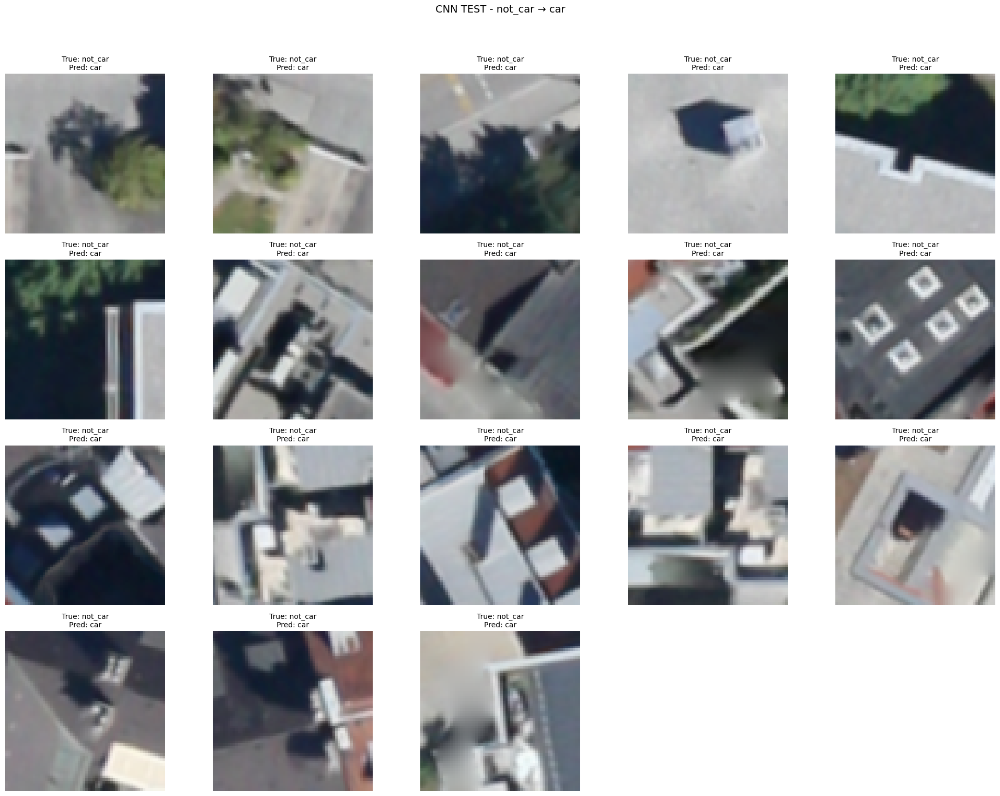


🎨 Visualizing CNN TRAIN (True: car, Pred: not_car)
🔍 Available class labels: ['car', 'not_car']
✅ No misclassifications in this group.

🎨 Visualizing CNN TRAIN (True: not_car, Pred: car)
🔍 Available class labels: ['car', 'not_car']


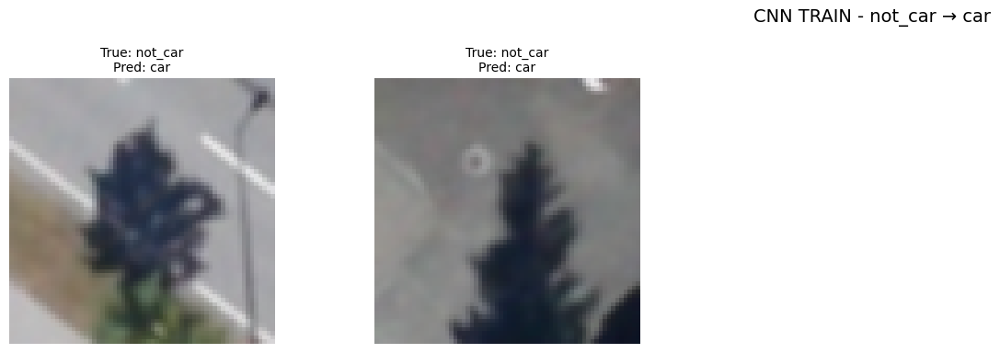


🎨 Visualizing RESNET18 TEST (True: car, Pred: not_car)
🔍 Available class labels: ['car', 'not_car']


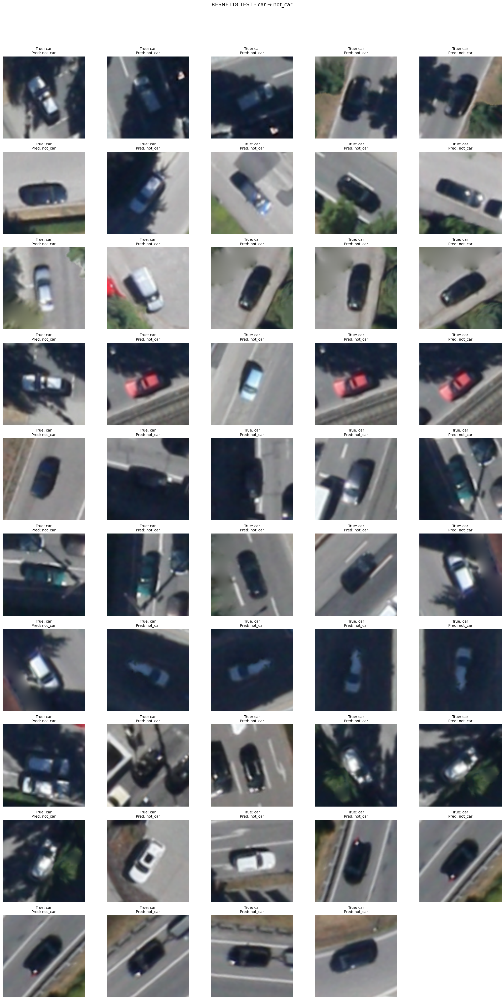


🎨 Visualizing RESNET18 TEST (True: not_car, Pred: car)
🔍 Available class labels: ['car', 'not_car']


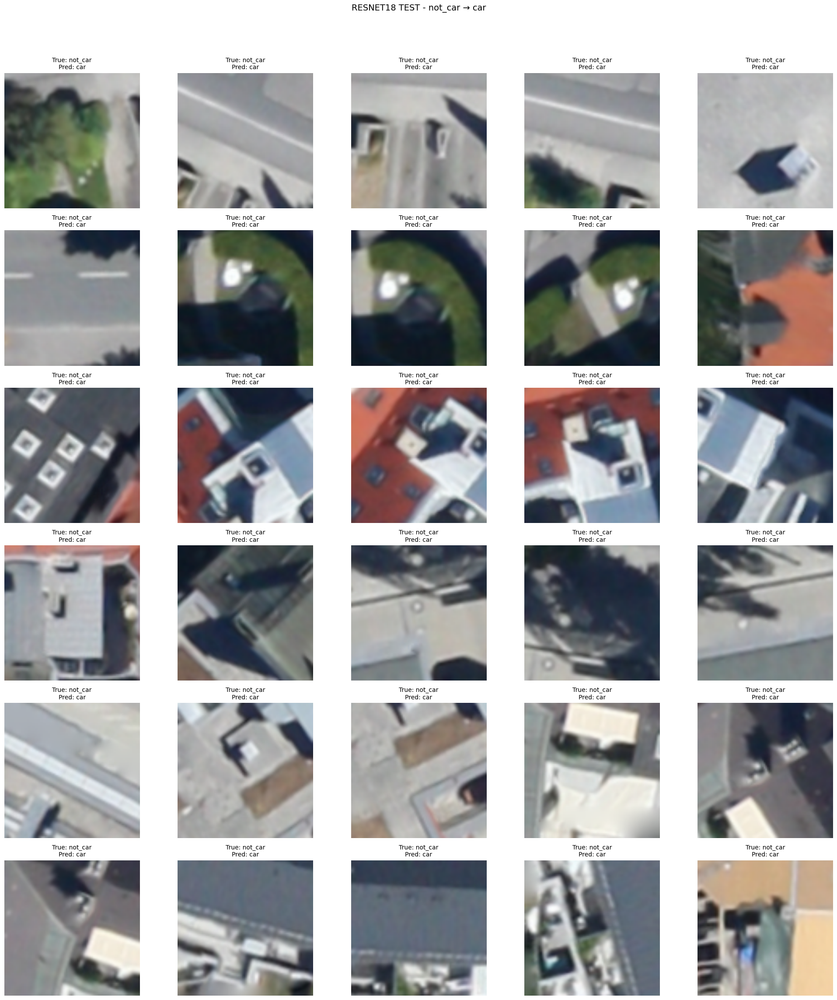


🎨 Visualizing RESNET18 TRAIN (True: car, Pred: not_car)
🔍 Available class labels: ['car', 'not_car']


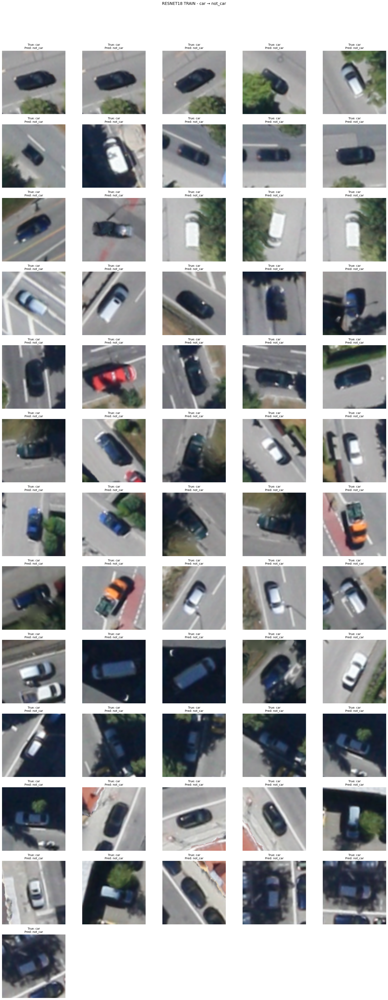


🎨 Visualizing RESNET18 TRAIN (True: not_car, Pred: car)
🔍 Available class labels: ['car', 'not_car']


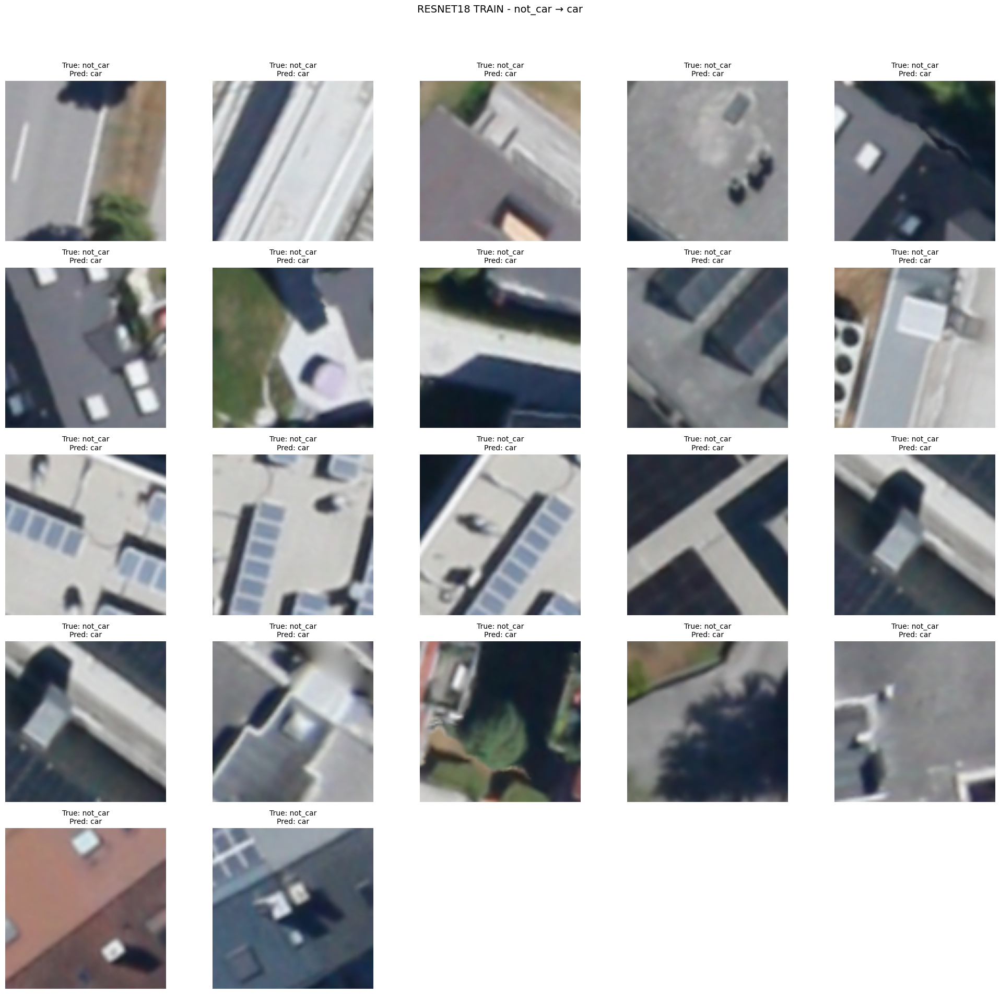

In [10]:
# -------------------- 10. Run 8 Misclassification Groups --------------------
print("\n================= MISCLASSIFICATION ANALYSIS (8 GROUPS) =================")

# CNN Model
visualize_specific_misclassifications(car_model, transform_cnn, cnn_model_path, 'test', class_names, 'CNN TEST', 'car', 'not_car')
visualize_specific_misclassifications(car_model, transform_cnn, cnn_model_path, 'test', class_names, 'CNN TEST', 'not_car', 'car')
visualize_specific_misclassifications(car_model, transform_cnn, cnn_model_path, 'train', class_names, 'CNN TRAIN', 'car', 'not_car')
visualize_specific_misclassifications(car_model, transform_cnn, cnn_model_path, 'train', class_names, 'CNN TRAIN', 'not_car', 'car')

# ResNet18 Model
visualize_specific_misclassifications(resnet_model, transform_resnet, resnet_model_path, 'test', class_names, 'RESNET18 TEST', 'car', 'not_car')
visualize_specific_misclassifications(resnet_model, transform_resnet, resnet_model_path, 'test', class_names, 'RESNET18 TEST', 'not_car', 'car')
visualize_specific_misclassifications(resnet_model, transform_resnet, resnet_model_path, 'train', class_names, 'RESNET18 TRAIN', 'car', 'not_car')
visualize_specific_misclassifications(resnet_model, transform_resnet, resnet_model_path, 'train', class_names, 'RESNET18 TRAIN', 'not_car', 'car')


In [13]:
# -------------------- 11. Evaluation Function --------------------
def evaluate_model(model, dataloader, transform, model_path, label_names, split_name, model_name):
    print(f"\n📊 Evaluation: {model_name.upper()} on {split_name.upper()} set")
    
    # Load model weights
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()
    
    # Prepare evaluation dataset
    dataset = datasets.ImageFolder(f"./data/{split_name}", transform=transform)
    loader = DataLoader(dataset, batch_size=32, shuffle=False)
    
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs.to(device))
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())

    # Print metrics
    print("Classification Report:")
    print(classification_report(all_labels, all_preds, target_names=label_names))
    print("Confusion Matrix:")
    print(confusion_matrix(all_labels, all_preds))
    print("Accuracy: {:.2f}%".format(accuracy_score(all_labels, all_preds) * 100))


In [14]:
# -------------------- 12. Run Evaluations --------------------
evaluate_model(car_model, train_loader_cnn, transform_cnn, cnn_model_path, class_names, 'train', 'CNN')
evaluate_model(car_model, val_loader_cnn, transform_cnn, cnn_model_path, class_names, 'test', 'CNN')

evaluate_model(resnet_model, train_loader_resnet, transform_resnet, resnet_model_path, class_names, 'train', 'ResNet18')
evaluate_model(resnet_model, val_loader_resnet, transform_resnet, resnet_model_path, class_names, 'test', 'ResNet18')



📊 Evaluation: CNN on TRAIN set


/var/folders/6r/lw1cp6x117zfdkxgl862fymc0000gn/T/ipykernel_14380/1446463954.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, 

Classification Report:
              precision    recall  f1-score   support

         car       1.00      1.00      1.00      1200
     not_car       1.00      1.00      1.00      3000

    accuracy                           1.00      4200
   macro avg       1.00      1.00      1.00      4200
weighted avg       1.00      1.00      1.00      4200

Confusion Matrix:
[[1200    0]
 [   2 2998]]
Accuracy: 99.95%

📊 Evaluation: CNN on TEST set


/var/folders/6r/lw1cp6x117zfdkxgl862fymc0000gn/T/ipykernel_14380/1446463954.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, 

Classification Report:
              precision    recall  f1-score   support

         car       0.95      0.90      0.93       400
     not_car       0.96      0.98      0.97       946

    accuracy                           0.96      1346
   macro avg       0.96      0.94      0.95      1346
weighted avg       0.96      0.96      0.96      1346

Confusion Matrix:
[[361  39]
 [ 18 928]]
Accuracy: 95.77%

📊 Evaluation: RESNET18 on TRAIN set


/var/folders/6r/lw1cp6x117zfdkxgl862fymc0000gn/T/ipykernel_14380/1446463954.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, 

Classification Report:
              precision    recall  f1-score   support

         car       0.98      0.95      0.96      1200
     not_car       0.98      0.99      0.99      3000

    accuracy                           0.98      4200
   macro avg       0.98      0.97      0.98      4200
weighted avg       0.98      0.98      0.98      4200

Confusion Matrix:
[[1139   61]
 [  22 2978]]
Accuracy: 98.02%

📊 Evaluation: RESNET18 on TEST set


/var/folders/6r/lw1cp6x117zfdkxgl862fymc0000gn/T/ipykernel_14380/1446463954.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, 

Classification Report:
              precision    recall  f1-score   support

         car       0.92      0.88      0.90       400
     not_car       0.95      0.97      0.96       946

    accuracy                           0.94      1346
   macro avg       0.94      0.92      0.93      1346
weighted avg       0.94      0.94      0.94      1346

Confusion Matrix:
[[351  49]
 [ 30 916]]
Accuracy: 94.13%
